In [1]:
# ============================================
# CELL 1 - IMPORT LIBRARIES
# ============================================

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from pathlib import Path
from ultralytics import YOLO

print("Libraries imported successfully.")


Libraries imported successfully.


In [2]:
# ============================================
# CELL 2 - PROJECT PATHS
# ============================================

PROJECT_DIR = Path.cwd()

MODELS_DIR = PROJECT_DIR / "models"
VIDEOS_DIR = PROJECT_DIR / "videos"
OUTPUT_DIR = PROJECT_DIR / "outputs"

MODELS_DIR.mkdir(exist_ok=True)
VIDEOS_DIR.mkdir(exist_ok=True)
OUTPUT_DIR.mkdir(exist_ok=True)

print("Project directory:", PROJECT_DIR)
print("Models directory :", MODELS_DIR)
print("Videos directory :", VIDEOS_DIR)
print("Output directory :", OUTPUT_DIR)

Project directory: C:\Users\lenovo\downloads\ANPR_Traffic_AI
Models directory : C:\Users\lenovo\downloads\ANPR_Traffic_AI\models
Videos directory : C:\Users\lenovo\downloads\ANPR_Traffic_AI\videos
Output directory : C:\Users\lenovo\downloads\ANPR_Traffic_AI\outputs


In [3]:
# ============================================
# CELL 3 - LOAD VEHICLE DETECTION MODEL
# ============================================

# Use the pretrained YOLO model for tracking
# because the custom vehicle model is not detecting
# vehicles in the current videos.

vehicle_model_path = PROJECT_DIR / "yolo26n.pt"

vehicle_model = YOLO(str(vehicle_model_path))

print("YOLO model loaded:")
print(vehicle_model_path)

print("\nModel classes:")
print(vehicle_model.names)

YOLO model loaded:
C:\Users\lenovo\downloads\ANPR_Traffic_AI\yolo26n.pt

Model classes:
{0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake', 56: 'chair', 57: 'couch', 58: 'potted plant', 59: 'bed', 60: 'dining table', 61: 'toilet', 62: 'tv'

In [4]:
# ============================================
# CELL 4 - VEHICLE CLASSES
# ============================================

print("Available classes:")
print(vehicle_model.names)

Available classes:
{0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake', 56: 'chair', 57: 'couch', 58: 'potted plant', 59: 'bed', 60: 'dining table', 61: 'toilet', 62: 'tv', 63: 'laptop', 64: 'mouse', 65: 'remote', 66: 'keyboard', 67: 'cell 

In [5]:
# ============================================
# CELL 5 - CHECK VIDEO FILES
# ============================================

video_extensions = [
    "*.mp4",
    "*.avi",
    "*.mov",
    "*.mkv"
]

video_files = []

for extension in video_extensions:

    video_files.extend(
        VIDEOS_DIR.glob(extension)
    )

print(
    "Videos found:",
    len(video_files)
)

for video in video_files:

    print(
        video.name
    )

Videos found: 3
cam_1.mp4
North-East.mp4
viofo.mp4


In [6]:
# ============================================
# CELL 6 - VIDEO INFORMATION
# ============================================

import os

for video_path in video_files:
    cap = cv2.VideoCapture(str(video_path))

    fps = cap.get(cv2.CAP_PROP_FPS)
    frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    duration = frames / fps if fps > 0 else 0

    cap.release()

    print(f"\n{video_path.name}")
    print(f"Resolution : {width} x {height}")
    print(f"FPS        : {fps:.2f}")
    print(f"Frames     : {frames}")
    print(f"Duration   : {duration:.2f} seconds")


cam_1.mp4
Resolution : 1280 x 720
FPS        : 25.00
Frames     : 615
Duration   : 24.60 seconds

North-East.mp4
Resolution : 1920 x 1080
FPS        : 30.00
Frames     : 1799
Duration   : 59.97 seconds

viofo.mp4
Resolution : 1920 x 1080
FPS        : 10.00
Frames     : 223
Duration   : 22.30 seconds


In [7]:
TEST_VIDEO = VIDEOS_DIR / "viofo.mp4"

if not TEST_VIDEO.exists():
    raise FileNotFoundError(f"Video not found: {TEST_VIDEO}")

print("Test camera:", TEST_VIDEO.name)

Test camera: viofo.mp4


In [8]:
# ============================================
# CELL 8 - VEHICLE TRACKING TEST
# ============================================

cap = cv2.VideoCapture(str(TEST_VIDEO))

if not cap.isOpened():
    raise RuntimeError(f"Could not open video: {TEST_VIDEO}")

frame_count = 0
max_frames = 300

track_records = []

# COCO vehicle classes
VEHICLE_CLASSES = {
    "car",
    "motorcycle",
    "bus",
    "truck"
}

while frame_count < max_frames:

    success, frame = cap.read()

    if not success:
        break

    results = vehicle_model.track(
        source=frame,
        persist=True,
        tracker="bytetrack.yaml",
        conf=0.20,
        imgsz=640,
        verbose=False
    )

    result = results[0]

    if result.boxes is not None and len(result.boxes) > 0:

        boxes = result.boxes.xyxy.cpu().numpy()
        classes = result.boxes.cls.cpu().numpy()

        if result.boxes.id is not None:
            track_ids = (
                result.boxes.id
                .cpu()
                .numpy()
                .astype(int)
            )
        else:
            track_ids = [-1] * len(boxes)

        for box, cls, track_id in zip(
            boxes, classes, track_ids
        ):

            class_name = vehicle_model.names[int(cls)]

            # Keep only vehicles
            if class_name not in VEHICLE_CLASSES:
                continue

            x1, y1, x2, y2 = box.astype(int)

            track_records.append({
                "camera": TEST_VIDEO.stem,
                "frame": frame_count,
                "track_id": int(track_id),
                "vehicle_type": class_name,
                "x1": x1,
                "y1": y1,
                "x2": x2,
                "y2": y2
            })

    frame_count += 1

cap.release()

tracks_df = pd.DataFrame(track_records)

print("Frames processed:", frame_count)
print("Tracking records:", len(tracks_df))

if len(tracks_df) > 0:

    print(
        "Unique vehicle IDs:",
        tracks_df["track_id"].nunique()
    )

    print("\nVehicle types:")
    print(
        tracks_df["vehicle_type"].value_counts()
    )

    display(tracks_df.head(10))

else:

    print("NO VEHICLES TRACKED")

Frames processed: 223
Tracking records: 1243
Unique vehicle IDs: 52

Vehicle types:
vehicle_type
car           843
truck         248
motorcycle     93
bus            59
Name: count, dtype: int64


,camera,frame,track_id,vehicle_type,x1,y1,x2,y2
0,viofo,0,1,car,948,755,1680,1080
1,viofo,0,3,car,109,0,477,237
2,viofo,0,4,car,1622,0,1919,239
3,viofo,0,5,truck,654,0,1660,954
4,viofo,0,6,motorcycle,538,96,666,365
5,viofo,0,8,car,0,136,71,336
6,viofo,0,9,car,1483,0,1657,241
7,viofo,0,10,bus,654,0,1660,954
8,viofo,0,11,motorcycle,1634,327,1798,781
9,viofo,1,1,car,986,775,1674,1080


Testing YOLO detection...
Objects detected: 4
- truck
- car
- car
- car


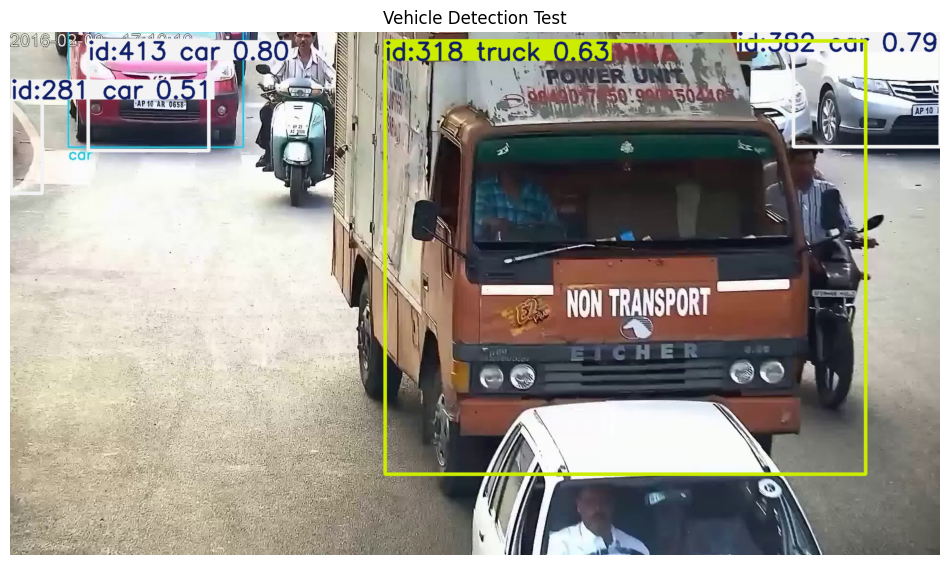

In [9]:
# ============================================
# CELL 9 - DETECTION DIAGNOSTIC
# ============================================

cap = cv2.VideoCapture(str(TEST_VIDEO))

success, frame = cap.read()

cap.release()

if not success:
    raise RuntimeError("Could not read first frame.")

print("Testing YOLO detection...")

results = vehicle_model.predict(
    source=frame,
    conf=0.15,
    imgsz=640,
    verbose=False
)

result = results[0]

if result.boxes is None or len(result.boxes) == 0:

    print("NO OBJECTS DETECTED")

else:

    print(
        "Objects detected:",
        len(result.boxes)
    )

    for cls in result.boxes.cls.cpu().numpy():

        class_id = int(cls)

        print(
            "-",
            vehicle_model.names[class_id]
        )

    annotated = result.plot()

    plt.figure(figsize=(12, 7))

    plt.imshow(
        cv2.cvtColor(
            annotated,
            cv2.COLOR_BGR2RGB
        )
    )

    plt.axis("off")
    plt.title("Vehicle Detection Test")
    plt.show()

In [10]:
# ============================================
# CELL 10 - VEHICLE CENTER POINTS
# ============================================

if tracks_df.empty:
    raise RuntimeError(
        "No tracking data available. Check Cell 8."
    )

tracks_df["center_x"] = (
    tracks_df["x1"] + tracks_df["x2"]
) / 2

tracks_df["center_y"] = (
    tracks_df["y1"] + tracks_df["y2"]
) / 2

fps = 30.0

tracks_df["time_sec"] = (
    tracks_df["frame"] / fps
)

print("Center points calculated.")

display(tracks_df.head(10))

Center points calculated.


,camera,frame,track_id,vehicle_type,x1,y1,x2,y2,center_x,center_y,time_sec
0,viofo,0,1,car,948,755,1680,1080,1314.0,917.5,0.000000
1,viofo,0,3,car,109,0,477,237,293.0,118.5,0.000000
2,viofo,0,4,car,1622,0,1919,239,1770.5,119.5,0.000000
3,viofo,0,5,truck,654,0,1660,954,1157.0,477.0,0.000000
4,viofo,0,6,motorcycle,538,96,666,365,602.0,230.5,0.000000
5,viofo,0,8,car,0,136,71,336,35.5,236.0,0.000000
6,viofo,0,9,car,1483,0,1657,241,1570.0,120.5,0.000000
7,viofo,0,10,bus,654,0,1660,954,1157.0,477.0,0.000000
8,viofo,0,11,motorcycle,1634,327,1798,781,1716.0,554.0,0.000000
9,viofo,1,1,car,986,775,1674,1080,1330.0,927.5,0.033333


In [11]:
# ============================================
# CELL 11 - BUILD VEHICLE TRAJECTORIES
# ============================================

trajectory_df = (
    tracks_df
    .sort_values(
        ["camera", "track_id", "frame"]
    )
    .copy()
)

trajectory_df["previous_x"] = (
    trajectory_df
    .groupby(["camera", "track_id"])["center_x"]
    .shift(1)
)

trajectory_df["previous_y"] = (
    trajectory_df
    .groupby(["camera", "track_id"])["center_y"]
    .shift(1)
)

trajectory_df["movement_pixels"] = np.sqrt(
    (
        trajectory_df["center_x"]
        - trajectory_df["previous_x"]
    ) ** 2
    +
    (
        trajectory_df["center_y"]
        - trajectory_df["previous_y"]
    ) ** 2
)

trajectory_df["movement_pixels"] = (
    trajectory_df["movement_pixels"]
    .fillna(0)
)

print("Trajectory data created.")

display(trajectory_df.head(10))

Trajectory data created.


,camera,frame,track_id,vehicle_type,x1,y1,x2,y2,center_x,center_y,time_sec,previous_x,previous_y,movement_pixels
0,viofo,0,1,car,948,755,1680,1080,1314.0,917.5,0.000000,NaN,NaN,0.000000
9,viofo,1,1,car,986,775,1674,1080,1330.0,927.5,0.033333,1314.0,917.5,18.867962
17,viofo,2,1,car,1041,805,1659,1076,1350.0,940.5,0.066667,1330.0,927.5,23.853721
25,viofo,3,1,car,1090,837,1640,1076,1365.0,956.5,0.100000,1350.0,940.5,21.931712
33,viofo,4,1,car,1157,875,1628,1074,1392.5,974.5,0.133333,1365.0,956.5,32.867157
1,viofo,0,3,car,109,0,477,237,293.0,118.5,0.000000,NaN,NaN,0.000000
10,viofo,1,3,bus,104,0,488,247,296.0,123.5,0.033333,293.0,118.5,5.830952
18,viofo,2,3,bus,102,1,496,254,299.0,127.5,0.066667,296.0,123.5,5.000000
26,viofo,3,3,car,104,1,506,258,305.0,129.5,0.100000,299.0,127.5,6.324555
34,viofo,4,3,car,96,1,512,269,304.0,135.0,0.133333,305.0,129.5,5.590170


In [12]:
# ============================================
# CELL 12 - VEHICLE SUMMARY
# ============================================

vehicle_summary = (
    trajectory_df
    .groupby(
        ["camera", "track_id", "vehicle_type"]
    )
    .agg(
        first_frame=("frame", "min"),
        last_frame=("frame", "max"),
        observations=("frame", "count"),
        total_movement_pixels=(
            "movement_pixels",
            "sum"
        )
    )
    .reset_index()
)

print(
    "Unique vehicles tracked:",
    len(vehicle_summary)
)

display(
    vehicle_summary.head(20)
)

Unique vehicles tracked: 82


,camera,track_id,vehicle_type,first_frame,last_frame,observations,total_movement_pixels
0,viofo,1,car,0,4,5,97.520552
1,viofo,3,bus,1,11,5,35.752509
2,viofo,3,car,0,88,82,1032.337521
3,viofo,4,car,0,9,7,42.932618
4,viofo,5,bus,4,9,2,39.720151
5,viofo,5,car,46,61,14,632.304017
6,viofo,5,truck,0,27,26,311.175593
7,viofo,6,motorcycle,0,49,48,849.451654
8,viofo,8,car,0,62,36,36.462652
9,viofo,9,car,0,3,4,85.678950


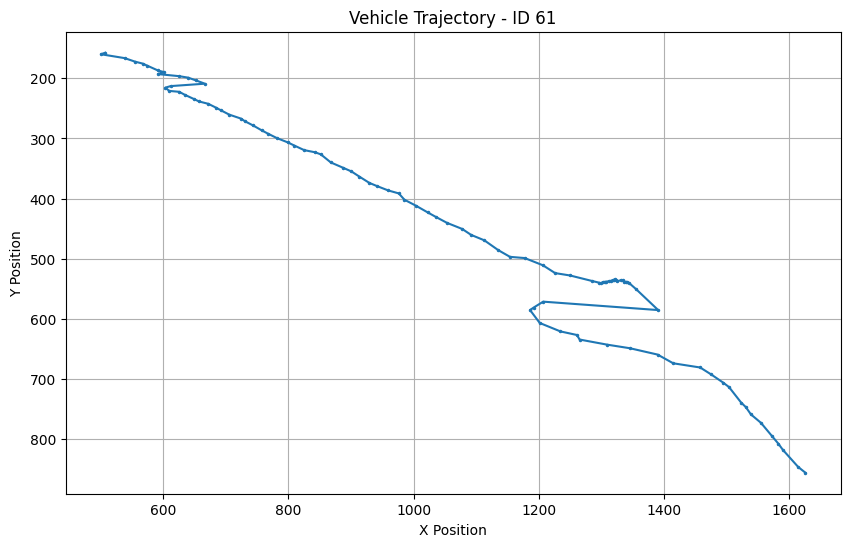

In [13]:
# ============================================
# CELL 13 - VEHICLE TRAJECTORY
# ============================================

vehicle_counts = (
    trajectory_df["track_id"]
    .value_counts()
)

if len(vehicle_counts) == 0:
    raise RuntimeError("No vehicles available.")

selected_id = vehicle_counts.index[0]

vehicle_path = (
    trajectory_df[
        trajectory_df["track_id"] == selected_id
    ]
    .sort_values("frame")
)

plt.figure(figsize=(10, 6))

plt.plot(
    vehicle_path["center_x"],
    vehicle_path["center_y"],
    marker=".",
    markersize=3
)

plt.gca().invert_yaxis()

plt.xlabel("X Position")
plt.ylabel("Y Position")

plt.title(
    f"Vehicle Trajectory - ID {selected_id}"
)

plt.grid(True)

plt.show()

In [14]:
# ============================================
# CELL 14 - SAVE TRACKING DATA
# ============================================

tracking_csv = (
    OUTPUT_DIR /
    f"{TEST_VIDEO.stem}_vehicle_tracking.csv"
)

trajectory_df.to_csv(
    tracking_csv,
    index=False
)

print("Tracking data saved successfully:")
print(tracking_csv)

Tracking data saved successfully:
C:\Users\lenovo\downloads\ANPR_Traffic_AI\outputs\viofo_vehicle_tracking.csv


In [15]:
# ============================================
# CELL 15 - MULTI-CAMERA TRACKING
# ============================================

all_camera_tracks = []

for video_path in video_files:

    print(f"\nProcessing camera: {video_path.name}")

    cap = cv2.VideoCapture(str(video_path))

    if not cap.isOpened():
        print("Could not open:", video_path.name)
        continue

    frame_count = 0
    max_frames = 300

    camera_records = []

    while frame_count < max_frames:

        success, frame = cap.read()

        if not success:
            break

        results = vehicle_model.track(
            source=frame,
            persist=True,
            tracker="bytetrack.yaml",
            conf=0.20,
            imgsz=640,
            verbose=False
        )

        result = results[0]

        if result.boxes is not None and len(result.boxes) > 0:

            boxes = result.boxes.xyxy.cpu().numpy()
            classes = result.boxes.cls.cpu().numpy()

            if result.boxes.id is not None:
                track_ids = (
                    result.boxes.id
                    .cpu()
                    .numpy()
                    .astype(int)
                )
            else:
                track_ids = [-1] * len(boxes)

            for box, cls, track_id in zip(
                boxes, classes, track_ids
            ):

                class_name = vehicle_model.names[int(cls)]

                if class_name not in VEHICLE_CLASSES:
                    continue

                x1, y1, x2, y2 = box.astype(int)

                camera_records.append({
                    "camera": video_path.stem,
                    "frame": frame_count,
                    "track_id": int(track_id),
                    "vehicle_type": class_name,
                    "x1": x1,
                    "y1": y1,
                    "x2": x2,
                    "y2": y2
                })

        frame_count += 1

    cap.release()

    camera_df = pd.DataFrame(camera_records)

    if not camera_df.empty:
        all_camera_tracks.append(camera_df)

    print(
        "Frames:",
        frame_count,
        "| Records:",
        len(camera_df)
    )


multi_camera_df = pd.concat(
    all_camera_tracks,
    ignore_index=True
)

print("\n================================")
print("MULTI-CAMERA PROCESSING COMPLETE")
print("================================")

print(
    "Total records:",
    len(multi_camera_df)
)

print(
    "Cameras processed:",
    multi_camera_df["camera"].nunique()
)

display(multi_camera_df.head(10))


Processing camera: cam_1.mp4
Frames: 300 | Records: 625

Processing camera: North-East.mp4
Frames: 300 | Records: 1274

Processing camera: viofo.mp4
Frames: 223 | Records: 1240

MULTI-CAMERA PROCESSING COMPLETE
Total records: 3139
Cameras processed: 3


,camera,frame,track_id,vehicle_type,x1,y1,x2,y2
0,cam_1,0,413,truck,154,0,444,267
1,cam_1,0,392,truck,474,1,1086,267
2,cam_1,1,413,truck,151,0,456,275
3,cam_1,1,392,truck,522,2,1123,268
4,cam_1,2,413,truck,129,0,444,285
5,cam_1,2,392,truck,540,2,1132,271
6,cam_1,3,413,truck,112,0,434,293
7,cam_1,3,392,truck,547,2,1132,272
8,cam_1,4,413,truck,100,0,430,302
9,cam_1,4,392,truck,547,2,1130,277


In [16]:
# ============================================
# CELL 16 - MULTI-CAMERA CENTER POINTS
# ============================================

multi_camera_df["center_x"] = (
    multi_camera_df["x1"] +
    multi_camera_df["x2"]
) / 2

multi_camera_df["center_y"] = (
    multi_camera_df["y1"] +
    multi_camera_df["y2"]
) / 2

multi_camera_df["time_sec"] = (
    multi_camera_df["frame"] / 30.0
)

print("Center points calculated.")

display(
    multi_camera_df.head(10)
)

Center points calculated.


,camera,frame,track_id,vehicle_type,x1,y1,x2,y2,center_x,center_y,time_sec
0,cam_1,0,413,truck,154,0,444,267,299.0,133.5,0.000000
1,cam_1,0,392,truck,474,1,1086,267,780.0,134.0,0.000000
2,cam_1,1,413,truck,151,0,456,275,303.5,137.5,0.033333
3,cam_1,1,392,truck,522,2,1123,268,822.5,135.0,0.033333
4,cam_1,2,413,truck,129,0,444,285,286.5,142.5,0.066667
5,cam_1,2,392,truck,540,2,1132,271,836.0,136.5,0.066667
6,cam_1,3,413,truck,112,0,434,293,273.0,146.5,0.100000
7,cam_1,3,392,truck,547,2,1132,272,839.5,137.0,0.100000
8,cam_1,4,413,truck,100,0,430,302,265.0,151.0,0.133333
9,cam_1,4,392,truck,547,2,1130,277,838.5,139.5,0.133333


In [17]:
# ============================================
# CELL 17 - MULTI-CAMERA TRAJECTORIES
# ============================================

multi_trajectory_df = (
    multi_camera_df
    .sort_values(
        ["camera", "track_id", "frame"]
    )
    .copy()
)

multi_trajectory_df["previous_x"] = (
    multi_trajectory_df
    .groupby(
        ["camera", "track_id"]
    )["center_x"]
    .shift(1)
)

multi_trajectory_df["previous_y"] = (
    multi_trajectory_df
    .groupby(
        ["camera", "track_id"]
    )["center_y"]
    .shift(1)
)

multi_trajectory_df["movement_pixels"] = np.sqrt(
    (
        multi_trajectory_df["center_x"]
        - multi_trajectory_df["previous_x"]
    ) ** 2
    +
    (
        multi_trajectory_df["center_y"]
        - multi_trajectory_df["previous_y"]
    ) ** 2
)

multi_trajectory_df[
    "movement_pixels"
] = multi_trajectory_df[
    "movement_pixels"
].fillna(0)

print("Multi-camera trajectories created.")

display(
    multi_trajectory_df.head(10)
)

Multi-camera trajectories created.


,camera,frame,track_id,vehicle_type,x1,y1,x2,y2,center_x,center_y,time_sec,previous_x,previous_y,movement_pixels
625,North-East,0,-1,truck,981,248,1580,904,1280.5,576.0,0.000000,NaN,NaN,0.000000
626,North-East,0,-1,car,1533,392,1669,612,1601.0,502.0,0.000000,1280.5,576.0,328.931984
627,North-East,0,-1,truck,690,315,951,598,820.5,456.5,0.000000,1601.0,502.0,781.825108
628,North-East,0,-1,truck,1533,392,1669,612,1601.0,502.0,0.000000,820.5,456.5,781.825108
629,North-East,1,575,truck,983,253,1579,905,1281.0,579.0,0.033333,NaN,NaN,0.000000
631,North-East,2,575,truck,987,258,1577,905,1282.0,581.5,0.066667,1281.0,579.0,2.692582
635,North-East,3,575,truck,997,275,1569,901,1283.0,588.0,0.100000,1282.0,581.5,6.576473
639,North-East,4,575,truck,1010,295,1570,905,1290.0,600.0,0.133333,1283.0,588.0,13.892444
643,North-East,5,575,truck,1018,302,1571,902,1294.5,602.0,0.166667,1290.0,600.0,4.924429
647,North-East,6,575,truck,993,292,1590,940,1291.5,616.0,0.200000,1294.5,602.0,14.317821


In [18]:
# ============================================
# CELL 18 - CAMERA-WISE VEHICLE COUNT
# ============================================

camera_vehicle_count = (
    multi_camera_df
    .groupby("camera")["track_id"]
    .nunique()
    .reset_index(
        name="unique_vehicles"
    )
)

print("Vehicles detected per camera:")

display(
    camera_vehicle_count
)

Vehicles detected per camera:


,camera,unique_vehicles
0,North-East,16
1,cam_1,20
2,viofo,51


In [19]:
# ============================================
# CELL 19 - VEHICLE TYPE ANALYSIS
# ============================================

vehicle_type_analysis = (
    multi_camera_df
    .groupby(
        ["camera", "vehicle_type"]
    )
    .size()
    .reset_index(
        name="detections"
    )
)

display(
    vehicle_type_analysis
)

,camera,vehicle_type,detections
0,North-East,bus,110
1,North-East,car,695
2,North-East,truck,469
3,cam_1,bus,52
4,cam_1,car,207
5,cam_1,motorcycle,29
6,cam_1,truck,337
7,viofo,bus,58
8,viofo,car,840
9,viofo,motorcycle,94


In [20]:
# ============================================
# CELL 20 - TRAFFIC DENSITY
# ============================================

traffic_density = (
    multi_camera_df
    .groupby(
        ["camera", "frame"]
    )["track_id"]
    .nunique()
    .reset_index(
        name="vehicles_in_frame"
    )
)

print("Traffic density calculated.")

display(
    traffic_density.head(20)
)

Traffic density calculated.


,camera,frame,vehicles_in_frame
0,North-East,0,1
1,North-East,1,2
2,North-East,2,4
3,North-East,3,4
4,North-East,4,4
5,North-East,5,4
6,North-East,6,4
7,North-East,7,4
8,North-East,8,4
9,North-East,9,4


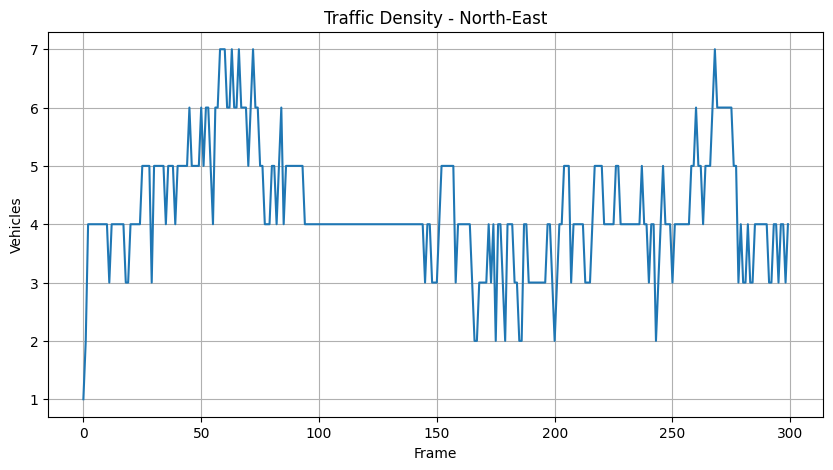

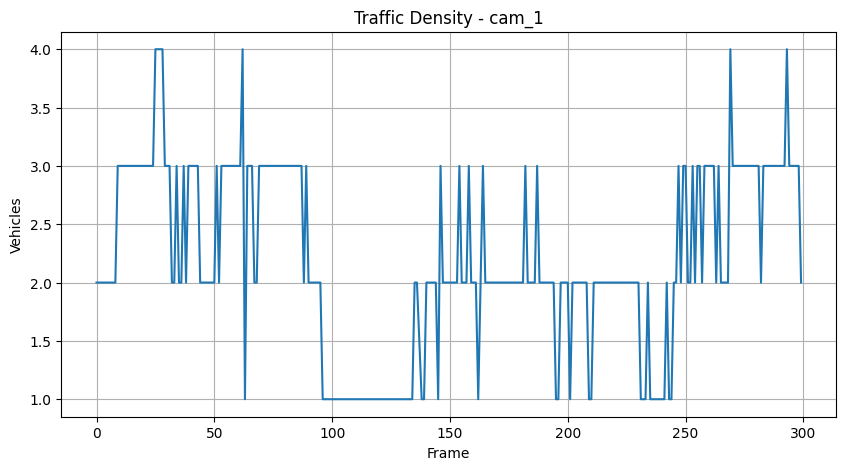

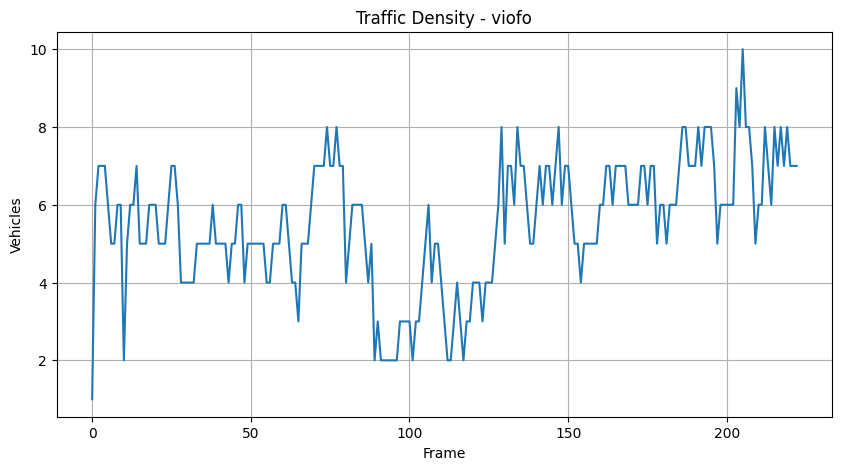

In [21]:
# ============================================
# CELL 21 - TRAFFIC DENSITY VISUALIZATION
# ============================================

for camera_name in traffic_density["camera"].unique():

    camera_data = traffic_density[
        traffic_density["camera"] == camera_name
    ]

    plt.figure(figsize=(10, 5))

    plt.plot(
        camera_data["frame"],
        camera_data["vehicles_in_frame"]
    )

    plt.xlabel("Frame")
    plt.ylabel("Vehicles")

    plt.title(
        f"Traffic Density - {camera_name}"
    )

    plt.grid(True)

    plt.show()

In [22]:
# ============================================
# CELL 22 - SAVE MULTI-CAMERA DATA
# ============================================

multi_camera_csv = (
    OUTPUT_DIR /
    "multi_camera_tracking.csv"
)

multi_trajectory_df.to_csv(
    multi_camera_csv,
    index=False
)

camera_summary_csv = (
    OUTPUT_DIR /
    "camera_vehicle_summary.csv"
)

camera_vehicle_count.to_csv(
    camera_summary_csv,
    index=False
)

print("Files saved:")
print(multi_camera_csv)
print(camera_summary_csv)

Files saved:
C:\Users\lenovo\downloads\ANPR_Traffic_AI\outputs\multi_camera_tracking.csv
C:\Users\lenovo\downloads\ANPR_Traffic_AI\outputs\camera_vehicle_summary.csv


In [23]:
# ============================================
# CELL 23 - CAMERA TRAFFIC SUMMARY
# ============================================

camera_summary = (
    multi_camera_df
    .groupby("camera")
    .agg(
        total_detections=("track_id", "count"),
        unique_vehicles=("track_id", "nunique"),
        avg_vehicles_per_frame=(
            "track_id",
            lambda x: x.groupby(
                multi_camera_df.loc[x.index, "frame"]
            ).nunique().mean()
        )
    )
    .reset_index()
)

print("Camera-wise traffic summary:")
display(camera_summary)

Camera-wise traffic summary:


,camera,total_detections,unique_vehicles,avg_vehicles_per_frame
0,North-East,1274,16,4.236667
1,cam_1,625,20,2.323420
2,viofo,1240,51,5.520179


In [24]:
# ============================================
# CELL 24 - MOVEMENT / SPEED PROXY
# ============================================

speed_proxy = (
    multi_trajectory_df
    .groupby(
        ["camera", "track_id"]
    )
    .agg(
        first_time=("time_sec", "min"),
        last_time=("time_sec", "max"),
        total_distance_pixels=(
            "movement_pixels",
            "sum"
        ),
        observations=("frame", "count")
    )
    .reset_index()
)

speed_proxy["duration_sec"] = (
    speed_proxy["last_time"]
    - speed_proxy["first_time"]
)

speed_proxy["pixel_speed"] = np.where(
    speed_proxy["duration_sec"] > 0,
    speed_proxy["total_distance_pixels"]
    / speed_proxy["duration_sec"],
    0
)

print("Speed proxy calculated.")

display(
    speed_proxy.head(20)
)

Speed proxy calculated.


,camera,track_id,first_time,last_time,total_distance_pixels,observations,duration_sec,pixel_speed
0,North-East,-1,0.000000,0.000000,1892.582200,4,0.000000,0.000000
1,North-East,575,0.033333,9.966667,1773.978197,268,9.933333,178.588409
2,North-East,576,0.033333,0.100000,17.362795,3,0.066667,260.441931
3,North-East,580,0.066667,2.800000,148.407162,49,2.733333,54.295303
4,North-East,581,0.066667,9.666667,1167.870073,227,9.600000,121.653133
5,North-East,584,0.133333,2.533333,639.146142,73,2.400000,266.310893
6,North-East,610,0.666667,0.700000,0.707107,2,0.033333,21.213203
7,North-East,616,0.833333,9.966667,1069.284798,274,9.133333,117.074978
8,North-East,630,1.433333,3.100000,113.023410,37,1.666667,67.814046
9,North-East,642,1.766667,5.800000,1055.905323,113,4.033333,261.794708


In [25]:
# ============================================
# CELL 25 - CAMERA SPEED ANALYSIS
# ============================================

camera_speed = (
    speed_proxy
    .groupby("camera")["pixel_speed"]
    .mean()
    .reset_index(
        name="average_pixel_speed"
    )
)

print("Average movement speed by camera:")

display(camera_speed)

Average movement speed by camera:


,camera,average_pixel_speed
0,North-East,202.387843
1,cam_1,217.944718
2,viofo,369.117122


In [26]:
# ============================================
# CELL 26 - TRAFFIC DENSITY SUMMARY
# ============================================

density_summary = (
    traffic_density
    .groupby("camera")["vehicles_in_frame"]
    .agg(
        average_density="mean",
        maximum_density="max",
        minimum_density="min"
    )
    .reset_index()
)

print("Traffic density summary:")

display(density_summary)

Traffic density summary:


,camera,average_density,maximum_density,minimum_density
0,North-East,4.236667,7,1
1,cam_1,2.323420,4,1
2,viofo,5.520179,10,1


In [27]:
# ============================================
# CELL 27 - CONGESTION INDICATOR
# ============================================

density_threshold = (
    density_summary["average_density"]
    .mean()
)

density_summary["traffic_status"] = np.where(
    density_summary["average_density"]
    >= density_threshold,
    "HIGH",
    "NORMAL"
)

print(
    "Overall average density threshold:",
    round(density_threshold, 2)
)

display(density_summary)

Overall average density threshold: 4.03


,camera,average_density,maximum_density,minimum_density,traffic_status
0,North-East,4.236667,7,1,HIGH
1,cam_1,2.323420,4,1,NORMAL
2,viofo,5.520179,10,1,HIGH


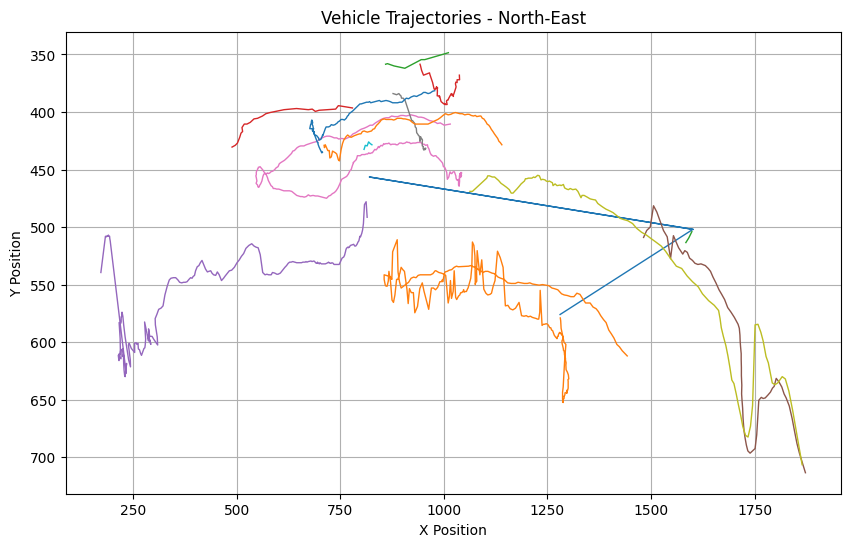

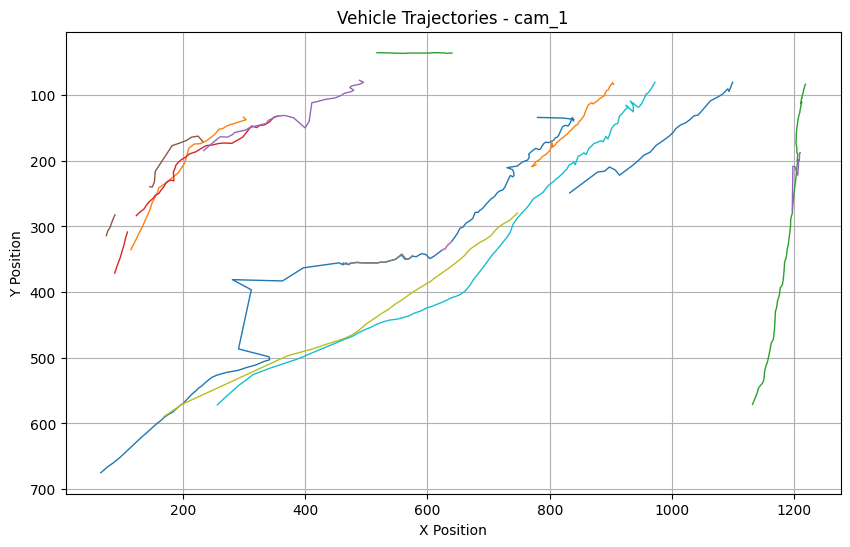

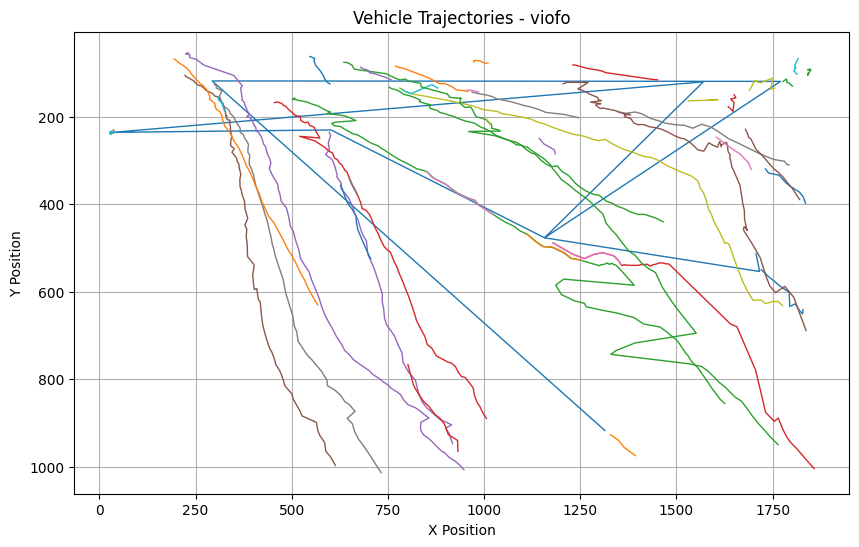

In [28]:
# ============================================
# CELL 28 - MULTI-CAMERA TRAJECTORY VIEW
# ============================================

for camera_name in (
    multi_trajectory_df["camera"].unique()
):

    camera_data = multi_trajectory_df[
        multi_trajectory_df["camera"] == camera_name
    ]

    plt.figure(figsize=(10, 6))

    for track_id in (
        camera_data["track_id"]
        .unique()
    ):

        vehicle_path = camera_data[
            camera_data["track_id"] == track_id
        ]

        if len(vehicle_path) < 3:
            continue

        plt.plot(
            vehicle_path["center_x"],
            vehicle_path["center_y"],
            linewidth=1
        )

    plt.gca().invert_yaxis()

    plt.xlabel("X Position")
    plt.ylabel("Y Position")

    plt.title(
        f"Vehicle Trajectories - {camera_name}"
    )

    plt.grid(True)
    plt.show()

In [29]:
# ============================================
# CELL 29 - SAVE TRAFFIC ANALYTICS
# ============================================

camera_summary.to_csv(
    OUTPUT_DIR / "camera_traffic_summary.csv",
    index=False
)

camera_speed.to_csv(
    OUTPUT_DIR / "camera_speed_analysis.csv",
    index=False
)

density_summary.to_csv(
    OUTPUT_DIR / "traffic_density_summary.csv",
    index=False
)

speed_proxy.to_csv(
    OUTPUT_DIR / "vehicle_speed_proxy.csv",
    index=False
)

print("Traffic analytics saved successfully.")

Traffic analytics saved successfully.


In [30]:
# ============================================
# CELL 30 - LOAD NUMBER PLATE DETECTION MODEL
# ============================================

from ultralytics import YOLO

PLATE_MODEL_PATH = MODELS_DIR / "number_plate_detection_best.pt"

if not PLATE_MODEL_PATH.exists():
    raise FileNotFoundError(
        f"Plate detection model not found:\n{PLATE_MODEL_PATH}"
    )

plate_model = YOLO(str(PLATE_MODEL_PATH))

print("Number plate detection model loaded successfully.")
print("Model:", PLATE_MODEL_PATH)

print("\nPlate model classes:")
print(plate_model.names)

Number plate detection model loaded successfully.
Model: C:\Users\lenovo\downloads\ANPR_Traffic_AI\models\number_plate_detection_best.pt

Plate model classes:
{0: 'plate'}


In [31]:
# ============================================
# CELL 31 - LOAD EASYOCR
# ============================================

import easyocr

reader = easyocr.Reader(
    ['en'],
    gpu=False
)

print("EasyOCR loaded successfully.")
print("Device: CPU")

Using CPU. Note: This module is much faster with a GPU.
C:\Users\lenovo\AppData\Roaming\Python\Python313\site-packages\torch\ao\nn\quantized\dynamic\modules\rnn.py:162: UserWarning: torch.quantize_per_tensor, torch.quantize_per_channel and other quantized tensor creation functions that produce tensors with dtype torch.quint8, torch.qint8, and torch.qint32 are deprecated and will be removed in a future PyTorch release. Please see https://github.com/pytorch/pytorch/issues/184982 for more information. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\aten\src\ATen\quantized\Quantizer.cpp:116.)
  w_ih = torch.quantize_per_tensor(


EasyOCR loaded successfully.
Device: CPU


In [32]:
# ============================================
# CELL 32 - OCR TEXT CLEANING
# ============================================

import re

def clean_plate_text(text):

    text = text.upper()

    # Remove spaces and special characters
    text = re.sub(
        r'[^A-Z0-9]',
        '',
        text
    )

    return text


print("OCR text cleaning function ready.")

OCR text cleaning function ready.


In [33]:
# ============================================
# CELL 33 - PLATE OCR FUNCTION
# ============================================

def read_plate_text(plate_crop):

    if plate_crop is None:
        return "", 0.0

    if plate_crop.size == 0:
        return "", 0.0

    # Upscale plate crop
    plate_crop = cv2.resize(
        plate_crop,
        None,
        fx=2,
        fy=2,
        interpolation=cv2.INTER_CUBIC
    )

    results = reader.readtext(
        plate_crop
    )

    if not results:
        return "", 0.0

    candidates = []

    for bbox, text, confidence in results:

        cleaned = clean_plate_text(text)

        if cleaned:

            candidates.append(
                (
                    cleaned,
                    float(confidence)
                )
            )

    if not candidates:
        return "", 0.0

    # Highest confidence result
    candidates.sort(
        key=lambda x: x[1],
        reverse=True
    )

    return candidates[0]


print("Plate OCR function ready.")

Plate OCR function ready.


In [34]:
# ============================================
# CELL 34 - MATCH PLATE WITH VEHICLE
# ============================================

def plate_inside_vehicle(
    plate_box,
    vehicle_box
):

    px1, py1, px2, py2 = plate_box
    vx1, vy1, vx2, vy2 = vehicle_box

    plate_center_x = (
        px1 + px2
    ) / 2

    plate_center_y = (
        py1 + py2
    ) / 2

    return (
        vx1 <= plate_center_x <= vx2
        and
        vy1 <= plate_center_y <= vy2
    )


print("Plate-vehicle matching function ready.")

Plate-vehicle matching function ready.


Testing Vehicle -> Plate detection...
Video: viofo.mp4


C:\Users\lenovo\AppData\Roaming\Python\Python313\site-packages\torch\utils\data\dataloader.py:759: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)



PLATE DETECTION TEST COMPLETE
Frames tested : 62
Plates found  : 6
Plate crops   : C:\Users\lenovo\downloads\ANPR_Traffic_AI\outputs\plate_crops


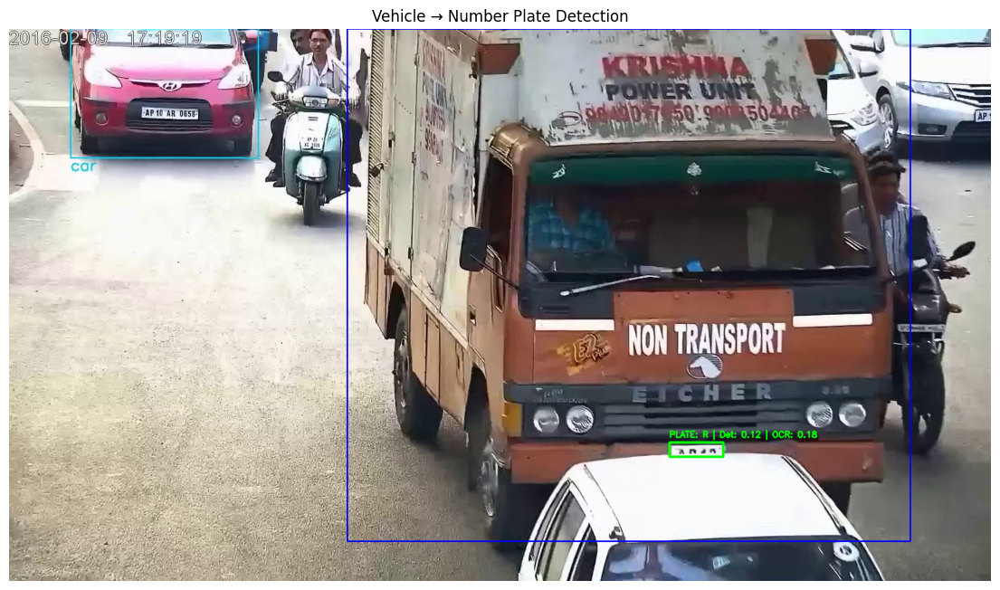

Example plate crop:
C:\Users\lenovo\downloads\ANPR_Traffic_AI\outputs\plate_crops\viofo_frame3_plate1.jpg


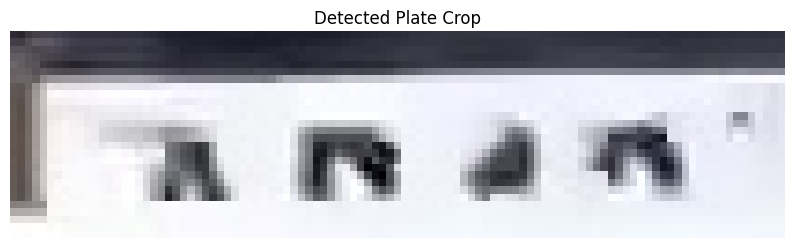

In [35]:
# ============================================
# CELL 35 - VEHICLE -> PLATE DETECTION TEST
# ============================================

import cv2
import matplotlib.pyplot as plt
from pathlib import Path

PLATE_DEBUG_DIR = OUTPUT_DIR / "plate_debug"
PLATE_CROP_DIR = OUTPUT_DIR / "plate_crops"

PLATE_DEBUG_DIR.mkdir(parents=True, exist_ok=True)
PLATE_CROP_DIR.mkdir(parents=True, exist_ok=True)

print("Testing Vehicle -> Plate detection...")
print("Video:", TEST_VIDEO.name)

cap = cv2.VideoCapture(str(TEST_VIDEO))

if not cap.isOpened():
    raise RuntimeError(f"Could not open video: {TEST_VIDEO}")

found_plates = 0
tested_frames = 0
best_result = None

MAX_TEST_FRAMES = 120

while tested_frames < MAX_TEST_FRAMES:

    success, frame = cap.read()

    if not success:
        break

    tested_frames += 1

    # ----------------------------------------
    # STEP 1: VEHICLE DETECTION
    # ----------------------------------------

    vehicle_results = vehicle_model.predict(
        source=frame,
        conf=0.20,
        imgsz=640,
        verbose=False
    )

    vehicle_result = vehicle_results[0]

    if (
        vehicle_result.boxes is None
        or len(vehicle_result.boxes) == 0
    ):
        continue

    vehicle_boxes = (
        vehicle_result.boxes
        .xyxy
        .cpu()
        .numpy()
    )

    annotated = frame.copy()

    frame_plate_count = 0

    # ----------------------------------------
    # STEP 2: PLATE DETECTION INSIDE VEHICLE
    # ----------------------------------------

    for vehicle_index, vehicle_box in enumerate(vehicle_boxes):

        vx1, vy1, vx2, vy2 = vehicle_box.astype(int)

        vx1 = max(0, vx1)
        vy1 = max(0, vy1)
        vx2 = min(frame.shape[1], vx2)
        vy2 = min(frame.shape[0], vy2)

        vehicle_crop = frame[
            vy1:vy2,
            vx1:vx2
        ]

        if vehicle_crop.size == 0:
            continue

        # Plate model runs on VEHICLE CROP
        plate_results = plate_model.predict(
            source=vehicle_crop,
            conf=0.10,
            imgsz=1280,
            verbose=False
        )

        plate_result = plate_results[0]

        if (
            plate_result.boxes is None
            or len(plate_result.boxes) == 0
        ):
            continue

        plate_boxes = (
            plate_result.boxes
            .xyxy
            .cpu()
            .numpy()
        )

        plate_confs = (
            plate_result.boxes
            .conf
            .cpu()
            .numpy()
        )

        for plate_box, plate_conf in zip(
            plate_boxes,
            plate_confs
        ):

            # Coordinates relative to vehicle crop
            px1, py1, px2, py2 = (
                plate_box.astype(int)
            )

            # Convert back to original frame
            fx1 = vx1 + px1
            fy1 = vy1 + py1
            fx2 = vx1 + px2
            fy2 = vy1 + py2

            fx1 = max(0, fx1)
            fy1 = max(0, fy1)
            fx2 = min(frame.shape[1], fx2)
            fy2 = min(frame.shape[0], fy2)

            plate_crop = frame[
                fy1:fy2,
                fx1:fx2
            ]

            if plate_crop.size == 0:
                continue

            found_plates += 1
            frame_plate_count += 1

            # OCR
            text, ocr_conf = read_plate_text(
                plate_crop
            )

            # Draw vehicle
            cv2.rectangle(
                annotated,
                (vx1, vy1),
                (vx2, vy2),
                (255, 0, 0),
                2
            )

            # Draw plate
            cv2.rectangle(
                annotated,
                (fx1, fy1),
                (fx2, fy2),
                (0, 255, 0),
                3
            )

            label = (
                f"PLATE: {text} "
                f"| Det: {float(plate_conf):.2f} "
                f"| OCR: {ocr_conf:.2f}"
            )

            cv2.putText(
                annotated,
                label,
                (fx1, max(25, fy1 - 10)),
                cv2.FONT_HERSHEY_SIMPLEX,
                0.55,
                (0, 255, 0),
                2
            )

            # Save actual plate crop
            crop_path = (
                PLATE_CROP_DIR /
                f"{TEST_VIDEO.stem}_frame{tested_frames}_plate{found_plates}.jpg"
            )

            cv2.imwrite(
                str(crop_path),
                plate_crop
            )

            # Keep best frame for display
            if best_result is None:
                best_result = (
                    annotated.copy(),
                    crop_path
                )

    # Save first useful annotated frame
    if frame_plate_count > 0:

        debug_path = (
            PLATE_DEBUG_DIR /
            f"{TEST_VIDEO.stem}_frame{tested_frames}_plates.jpg"
        )

        cv2.imwrite(
            str(debug_path),
            annotated
        )

        # Stop once we have enough examples
        if found_plates >= 6:
            break

cap.release()

print("\n===================================")
print("PLATE DETECTION TEST COMPLETE")
print("===================================")
print("Frames tested :", tested_frames)
print("Plates found  :", found_plates)
print("Plate crops   :", PLATE_CROP_DIR)

# ----------------------------------------
# SHOW RESULT
# ----------------------------------------

if best_result is not None:

    annotated_image, crop_path = best_result

    plt.figure(figsize=(14, 8))

    plt.imshow(
        cv2.cvtColor(
            annotated_image,
            cv2.COLOR_BGR2RGB
        )
    )

    plt.axis("off")
    plt.title(
        "Vehicle → Number Plate Detection"
    )

    plt.show()

    print("Example plate crop:")
    print(crop_path)

    plate_img = cv2.imread(str(crop_path))

    if plate_img is not None:

        plt.figure(figsize=(10, 4))

        plt.imshow(
            cv2.cvtColor(
                plate_img,
                cv2.COLOR_BGR2RGB
            )
        )

        plt.axis("off")
        plt.title("Detected Plate Crop")

        plt.show()

else:

    print("\n❌ NO PLATE DETECTED.")
    print("Do NOT run the full video processing yet.")

Frames selected: 6
Frame 0: 16 detections
Confidences: [    0.15931     0.12128    0.061682     0.05676    0.051072    0.047163    0.044194     0.02943    0.028937    0.020029    0.019714     0.01954    0.018893    0.013683    0.012435    0.011954]
Boxes: [[     249.16      126.73       372.2      171.33]
 [     232.32      124.27      370.83      169.95]
 [     241.51      130.32      372.79      167.02]
 [     25.785      234.15      189.24      322.98]
 [     1234.5      519.02      1452.5      599.44]
 [     1142.5      519.06      1235.7      599.62]
 [     969.82       513.8      1128.8      549.63]
 [     1223.2      520.05      1445.2      597.94]
 [      250.2      120.83      371.55      176.79]
 [     1222.4      505.91      1456.2      602.38]
 [     234.95      123.37      373.78      176.72]
 [     1855.3      146.13        1920      179.35]
 [     1236.7      502.42      1457.2      603.55]
 [     1246.1      517.91      1455.6      602.77]
 [     1217.1      507.95     

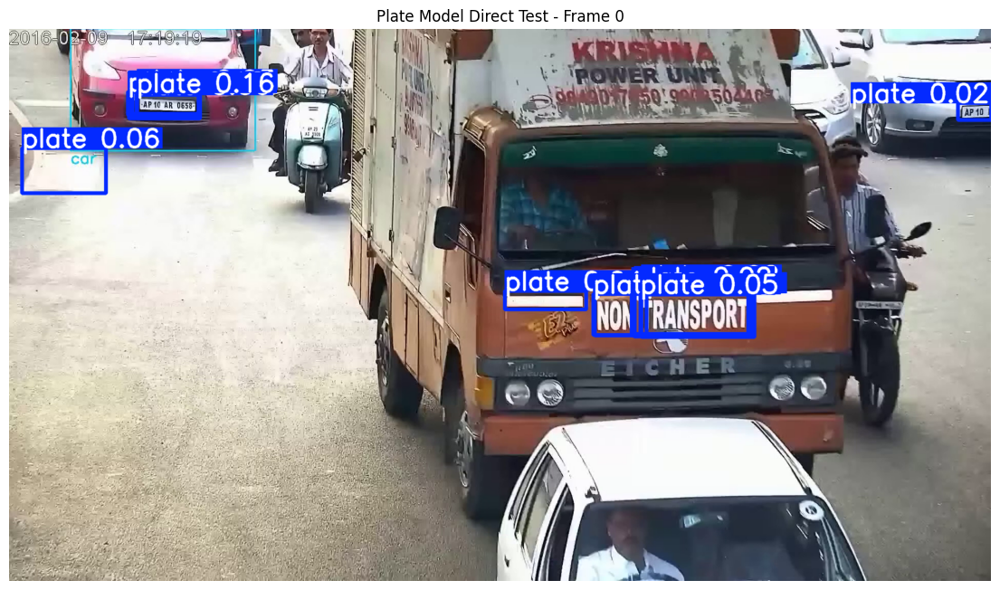

Frame 5: 15 detections
Confidences: [    0.72915     0.14457     0.13775     0.11427     0.03535     0.03458    0.032044    0.029629    0.023714    0.020764    0.014388    0.013026    0.011514    0.011141    0.010091]
Boxes: [[     249.19      149.97      398.43      206.68]
 [     1370.3      884.41      1490.8      930.62]
 [       1373      880.86      1494.1      934.53]
 [     249.13      155.91      393.19      201.06]
 [     1378.3      632.05      1612.1      714.65]
 [     1375.8      634.05      1611.9       713.4]
 [     533.61      174.75      653.06      272.65]
 [     251.44      153.55      396.39      201.13]
 [     1289.1      627.54        1386      719.16]
 [     252.34      143.29      400.25      210.21]
 [     1381.5      620.04      1615.6      719.82]
 [     254.06      151.33      400.67      208.61]
 [     1101.9      621.77      1273.6      666.27]
 [     1140.3         652      1264.5       733.7]
 [     1288.8      632.64      1382.8      713.58]]


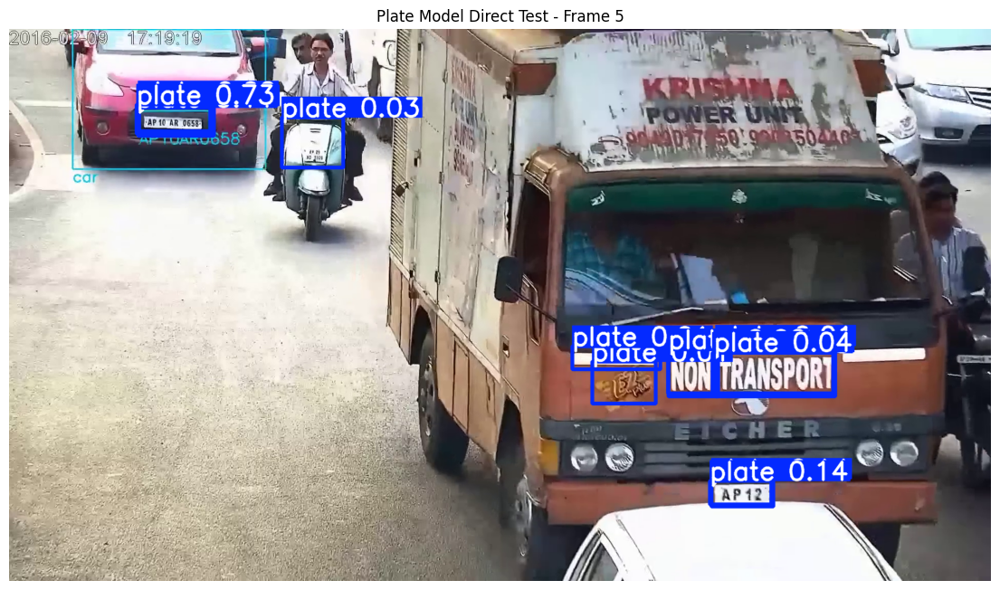

Frame 10: 19 detections
Confidences: [     0.6827     0.37815     0.30964     0.17883     0.13548    0.047967    0.044904    0.023322    0.022787    0.022578    0.021509    0.020716    0.020414    0.017644    0.017264    0.014842    0.013068    0.012175    0.011912]
Boxes: [[     247.88      190.76      406.01      246.58]
 [     1509.8      1007.4      1657.2        1080]
 [     1510.5      998.01      1659.4        1080]
 [     1423.2      751.31      1524.5      844.67]
 [     247.31      184.04      406.06      251.73]
 [     247.18      193.27      396.88      241.09]
 [     1511.9      1005.2      1656.6        1080]
 [       1271      771.33      1399.8      866.29]
 [     1510.9      1009.8        1653      1079.4]
 [     1267.4      777.65      1399.3      864.05]
 [     248.56      201.43      393.71      243.25]
 [     249.75      187.46      409.64      251.52]
 [     249.62      175.08      407.99      255.07]
 [     1521.1      757.06      1701.8      843.33]
 [     1420.

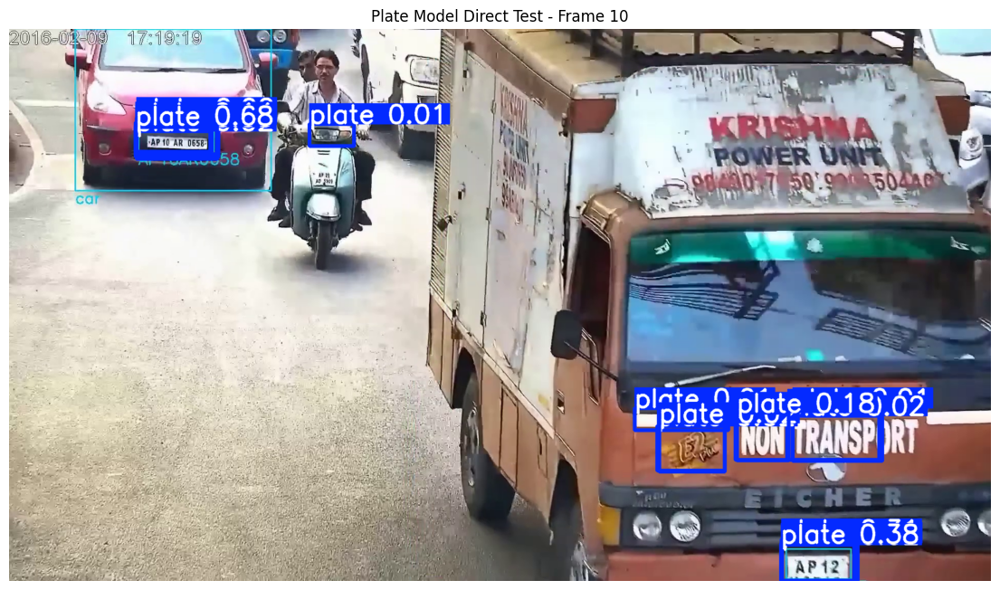

Frame 15: 12 detections
Confidences: [    0.51089     0.42069    0.065682    0.059548    0.056176    0.047762    0.042396    0.020707    0.013653    0.013291    0.011245     0.01118]
Boxes: [[     261.49      219.92      426.82      282.46]
 [     260.17      226.31      418.77       278.5]
 [       1574      884.75        1681      988.17]
 [     1405.7      917.66      1542.1      1006.7]
 [     1338.7       497.7      1509.8         583]
 [     261.37      226.97      415.93      270.89]
 [     263.04      225.25      424.31      278.76]
 [     607.33      375.83      683.61      438.07]
 [     821.23      23.094      930.02      166.26]
 [          0           0      137.13      42.053]
 [       1409      907.38      1542.9      1010.1]
 [     1405.1      917.15      1540.3        1004]]


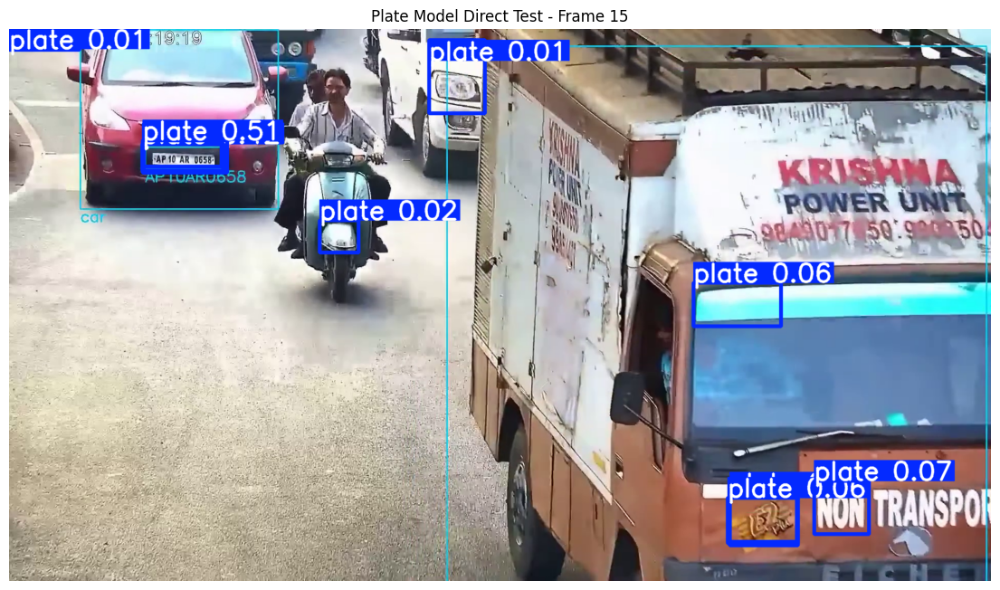

Frame 20: 9 detections
Confidences: [    0.43421     0.34738    0.071487    0.035236    0.033075    0.017989    0.014961    0.012911    0.012391]
Boxes: [[     288.43      275.78      422.77      313.77]
 [     288.98      272.72      424.73      318.88]
 [     289.69      265.33      428.61      323.57]
 [      290.6      272.32      428.82      319.25]
 [     648.55      404.24      714.93      453.69]
 [     276.83      274.77       429.3      313.92]
 [     1496.3      629.96      1698.4      725.91]
 [     648.95       405.7      709.71      452.28]
 [     1495.6      635.35      1658.5      723.87]]


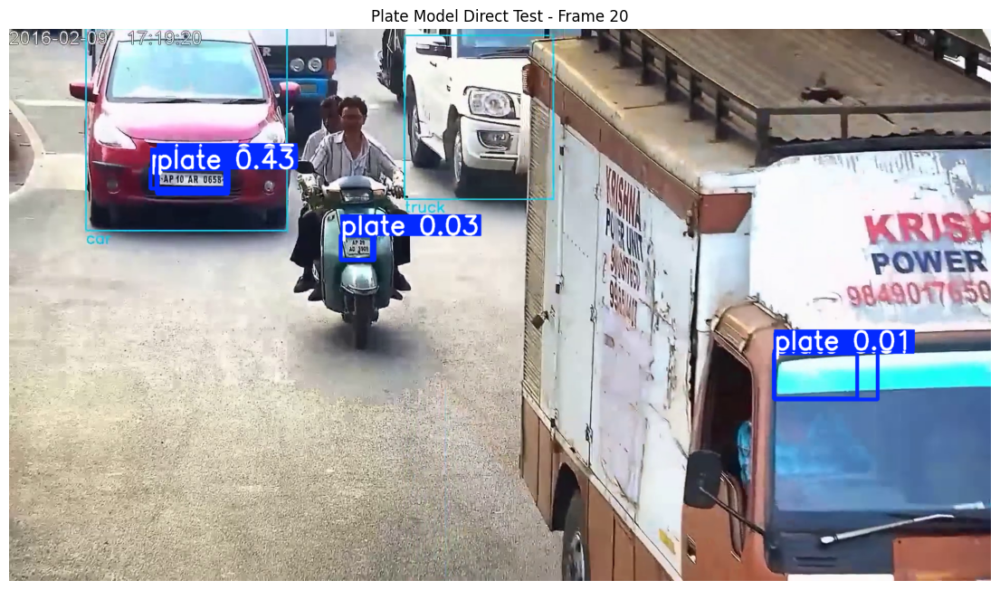

Frame 25: 7 detections
Confidences: [    0.88463     0.09422    0.047067    0.017789     0.01609     0.01486    0.011339]
Boxes: [[     292.54      294.24      464.43      356.52]
 [     293.52      301.69      448.42      351.21]
 [     293.86      286.96      465.34      359.19]
 [     1648.7      765.52      1826.9      857.47]
 [     950.98      128.93      1083.8      232.09]
 [     294.42      297.55       460.7       352.8]
 [     294.62      295.15      464.31       360.2]]


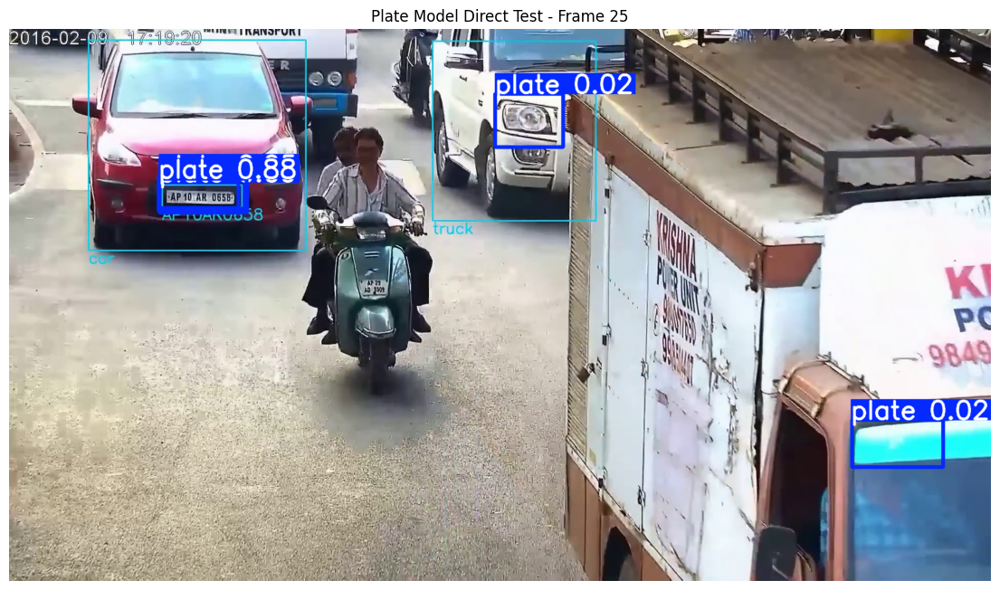

In [36]:
# ============================================
# DIAGNOSTIC - TEST PLATE MODEL DIRECTLY
# ============================================

import cv2
import matplotlib.pyplot as plt

cap = cv2.VideoCapture(str(TEST_VIDEO))

if not cap.isOpened():
    raise RuntimeError(f"Could not open video: {TEST_VIDEO}")

# Read a few frames
test_frames = []

for i in range(30):
    success, frame = cap.read()

    if not success:
        break

    if i in [0, 5, 10, 15, 20, 25]:
        test_frames.append((i, frame.copy()))

cap.release()

print("Frames selected:", len(test_frames))

# --------------------------------------------
# Run PLATE MODEL directly on full frames
# --------------------------------------------

for frame_no, frame in test_frames:

    results = plate_model.predict(
        source=frame,
        conf=0.01,
        imgsz=1280,
        verbose=False
    )

    result = results[0]

    annotated = result.plot()

    print(
        f"Frame {frame_no}: "
        f"{len(result.boxes) if result.boxes is not None else 0} detections"
    )

    if result.boxes is not None and len(result.boxes) > 0:

        print(
            "Confidences:",
            result.boxes.conf.cpu().numpy()
        )

        print(
            "Boxes:",
            result.boxes.xyxy.cpu().numpy()
        )

    plt.figure(figsize=(14, 8))

    plt.imshow(
        cv2.cvtColor(
            annotated,
            cv2.COLOR_BGR2RGB
        )
    )

    plt.title(
        f"Plate Model Direct Test - Frame {frame_no}"
    )

    plt.axis("off")
    plt.show()

In [37]:
# ============================================
# CELL 36 - MULTI-CAMERA VEHICLE + PLATE + OCR
# ============================================

OCR_INTERVAL = 10
MAX_FRAMES_PER_VIDEO = 300

final_records = []

for video_path in video_files:

    print(
        f"\nProcessing camera: {video_path.name}"
    )

    cap = cv2.VideoCapture(
        str(video_path)
    )

    if not cap.isOpened():
        print(
            "Could not open:",
            video_path.name
        )
        continue

    frame_count = 0

    last_ocr = {}

    while (
        frame_count < MAX_FRAMES_PER_VIDEO
    ):

        success, frame = cap.read()

        if not success:
            break

        # -----------------------------
        # VEHICLE TRACKING
        # -----------------------------

        vehicle_results = vehicle_model.track(
            source=frame,
            persist=True,
            tracker="bytetrack.yaml",
            conf=0.20,
            imgsz=640,
            verbose=False
        )

        vehicle_result = vehicle_results[0]

        vehicle_data = []

        if (
            vehicle_result.boxes is not None
            and
            len(vehicle_result.boxes) > 0
        ):

            boxes = (
                vehicle_result
                .boxes
                .xyxy
                .cpu()
                .numpy()
            )

            classes = (
                vehicle_result
                .boxes
                .cls
                .cpu()
                .numpy()
            )

            if vehicle_result.boxes.id is not None:

                track_ids = (
                    vehicle_result
                    .boxes
                    .id
                    .cpu()
                    .numpy()
                    .astype(int)
                )

            else:

                track_ids = [
                    -1
                ] * len(boxes)

            for box, cls, track_id in zip(
                boxes,
                classes,
                track_ids
            ):

                class_name = (
                    vehicle_model
                    .names[int(cls)]
                )

                if class_name not in VEHICLE_CLASSES:
                    continue

                vehicle_data.append(
                    {
                        "box": box.astype(int),
                        "track_id": int(track_id),
                        "vehicle_type": class_name
                    }
                )

        # -----------------------------
        # NUMBER PLATE DETECTION
        # -----------------------------

        plate_results = plate_model.predict(
            source=frame,
            conf=0.25,
            imgsz=640,
            verbose=False
        )

        plate_result = plate_results[0]

        if (
            plate_result.boxes is not None
            and
            len(plate_result.boxes) > 0
        ):

            plate_boxes = (
                plate_result
                .boxes
                .xyxy
                .cpu()
                .numpy()
            )

            for plate_box in plate_boxes:

                px1, py1, px2, py2 = (
                    plate_box.astype(int)
                )

                plate_crop = frame[
                    py1:py2,
                    px1:px2
                ]

                # -------------------------
                # FIND VEHICLE
                # -------------------------

                matched_vehicle = None

                for vehicle in vehicle_data:

                    if plate_inside_vehicle(
                        plate_box,
                        vehicle["box"]
                    ):

                        matched_vehicle = vehicle
                        break

                if matched_vehicle is None:
                    continue

                track_id = (
                    matched_vehicle[
                        "track_id"
                    ]
                )

                # -------------------------
                # OCR
                # -------------------------

                plate_text = ""
                ocr_confidence = 0.0

                if (
                    frame_count % OCR_INTERVAL == 0
                    or
                    track_id not in last_ocr
                ):

                    plate_text, ocr_confidence = (
                        read_plate_text(
                            plate_crop
                        )
                    )

                    if plate_text:

                        last_ocr[
                            track_id
                        ] = (
                            plate_text,
                            ocr_confidence
                        )

                elif track_id in last_ocr:

                    plate_text, ocr_confidence = (
                        last_ocr[track_id]
                    )

                # -------------------------
                # SAVE RECORD
                # -------------------------

                final_records.append(
                    {
                        "camera":
                            video_path.stem,

                        "frame":
                            frame_count,

                        "time_sec":
                            frame_count / 30.0,

                        "vehicle_id":
                            track_id,

                        "vehicle_type":
                            matched_vehicle[
                                "vehicle_type"
                            ],

                        "plate_text":
                            plate_text,

                        "ocr_confidence":
                            ocr_confidence,

                        "plate_x1":
                            px1,

                        "plate_y1":
                            py1,

                        "plate_x2":
                            px2,

                        "plate_y2":
                            py2
                    }
                )

        frame_count += 1

    cap.release()

    print(
        "Frames processed:",
        frame_count
    )

print(
    "\nTotal plate records:",
    len(final_records)
)


Processing camera: cam_1.mp4
Frames processed: 300

Processing camera: North-East.mp4
Frames processed: 300

Processing camera: viofo.mp4
Frames processed: 223

Total plate records: 255


In [38]:
# ============================================
# CELL 37 - FINAL ANPR DATAFRAME
# ============================================

anpr_df = pd.DataFrame(
    final_records
)

if anpr_df.empty:

    raise RuntimeError(
        "No ANPR records were generated."
    )

print(
    "ANPR records:",
    len(anpr_df)
)

print(
    "Cameras:",
    anpr_df["camera"].nunique()
)

print(
    "Vehicle IDs:",
    anpr_df["vehicle_id"].nunique()
)

display(
    anpr_df.head(20)
)

ANPR records: 255
Cameras: 3
Vehicle IDs: 16


,camera,frame,time_sec,vehicle_id,vehicle_type,plate_text,ocr_confidence,plate_x1,plate_y1,plate_x2,plate_y2
0,cam_1,0,0.000000,-1,truck,,0.000000,768,144,838,193
1,cam_1,1,0.033333,1337,truck,,0.000000,768,144,838,193
2,cam_1,2,0.066667,1337,truck,,0.000000,764,149,838,198
3,cam_1,3,0.100000,1337,truck,,0.000000,760,150,837,201
4,cam_1,6,0.200000,1337,truck,,0.000000,751,166,824,218
5,cam_1,7,0.233333,1337,truck,I03A,0.093074,746,167,822,222
6,cam_1,8,0.266667,1337,truck,I03A,0.093074,743,175,820,228
7,cam_1,13,0.433333,1337,truck,I03A,0.093074,726,194,808,249
8,cam_1,16,0.533333,1337,truck,I03A,0.093074,717,210,793,264
9,cam_1,17,0.566667,1337,truck,I03A,0.093074,713,211,791,268


In [39]:
# ============================================
# CELL 38 - OCR RESULTS ANALYSIS
# ============================================

print("OCR results generated:", len(anpr_df))

print("\nOCR text frequency:")
display(
    anpr_df["plate_text"]
    .astype(str)
    .value_counts()
    .reset_index(name="count")
    .rename(columns={"index": "plate_text"})
)

print("\nDetailed OCR results:")
display(
    anpr_df[
        [
            "camera",
            "frame",
            "vehicle_id",
            "vehicle_type",
            "plate_text",
            "ocr_confidence"
        ]
    ]
)

OCR results generated: 255

OCR text frequency:


,plate_text,count
0,TSO9EG6531,24
1,IS00UN26GG,24
2,AP10AR06584,14
3,5546,12
4,HHOOIQISIO,11
5,TS09EG5531,11
6,AP2GAG1350,11
7,APTOARO658,10
8,APO9CU6490,10
9,L01253,9



Detailed OCR results:


,camera,frame,vehicle_id,vehicle_type,plate_text,ocr_confidence
0,cam_1,0,-1,truck,,0.000000
1,cam_1,1,1337,truck,,0.000000
2,cam_1,2,1337,truck,,0.000000
3,cam_1,3,1337,truck,,0.000000
4,cam_1,6,1337,truck,,0.000000
...,...,...,...,...,...,...
250,viofo,219,2004,car,APO9CU6490,0.210631
251,viofo,219,2004,car,APO9CU6490,0.210631
252,viofo,220,2015,car,APL4J6,0.075207
253,viofo,220,2004,car,APO9CU6490,0.728068


In [40]:
# ============================================
# DIAGNOSTIC - INSPECT PLATE CROPS
# ============================================

import matplotlib.pyplot as plt
import cv2
from pathlib import Path

debug_dir = PROJECT_DIR / "outputs" / "plate_debug"
debug_dir.mkdir(parents=True, exist_ok=True)

shown = 0

for video_path in video_files:

    cap = cv2.VideoCapture(str(video_path))

    if not cap.isOpened():
        continue

    frame_no = 0

    while frame_no < 100 and shown < 12:

        success, frame = cap.read()

        if not success:
            break

        frame_no += 1

        # Use vehicle model
        results = vehicle_model.predict(
            source=frame,
            conf=0.20,
            imgsz=640,
            verbose=False
        )

        result = results[0]

        if result.boxes is None or len(result.boxes) == 0:
            continue

        boxes = result.boxes.xyxy.cpu().numpy()

        for box in boxes:

            x1, y1, x2, y2 = map(int, box)

            x1 = max(0, x1)
            y1 = max(0, y1)
            x2 = min(frame.shape[1], x2)
            y2 = min(frame.shape[0], y2)

            crop = frame[y1:y2, x1:x2]

            if crop.size == 0:
                continue

            cv2.imwrite(
                str(
                    debug_dir /
                    f"{video_path.stem}_{frame_no}_{shown}.jpg"
                ),
                crop
            )

            shown += 1

            if shown >= 12:
                break

    cap.release()

print("Saved diagnostic vehicle crops:", shown)
print("Folder:", debug_dir)

Saved diagnostic vehicle crops: 12
Folder: C:\Users\lenovo\downloads\ANPR_Traffic_AI\outputs\plate_debug


Images found: 43


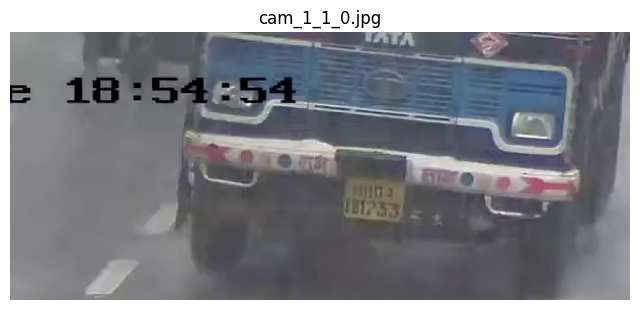

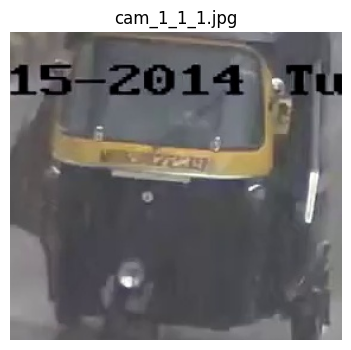

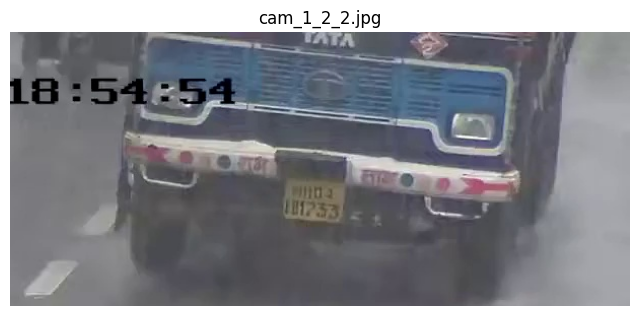

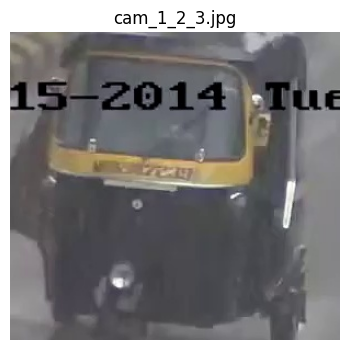

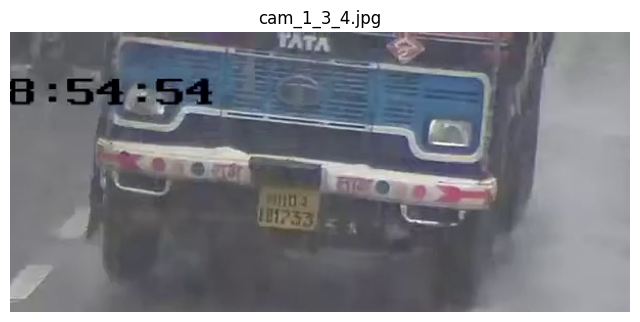

...

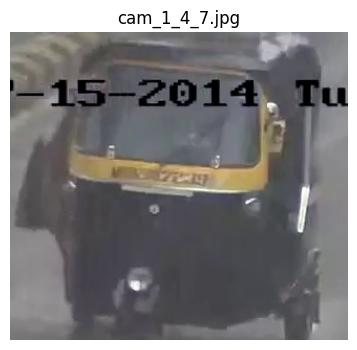

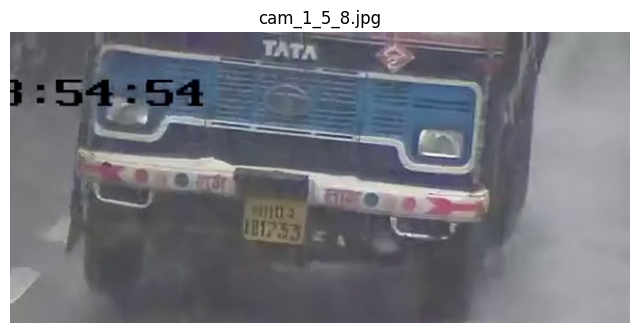

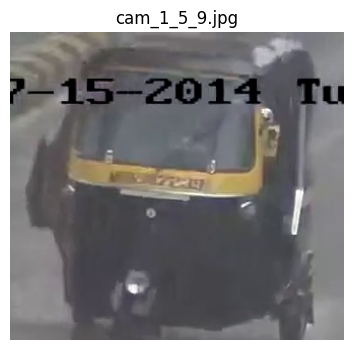

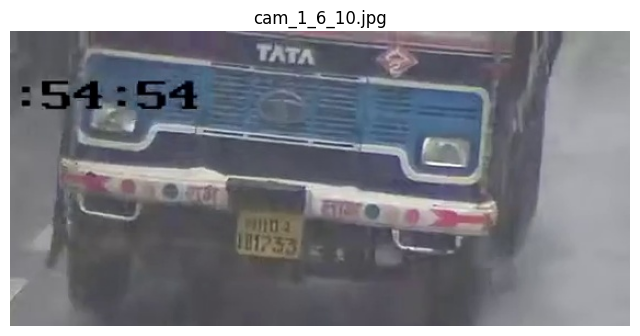

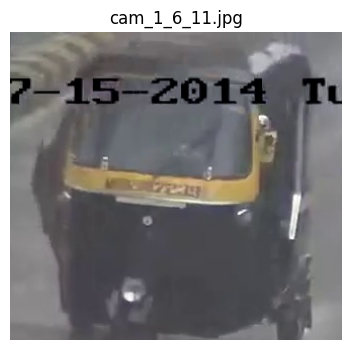

In [41]:
# ============================================
# SHOW DIAGNOSTIC CROPS
# ============================================

from PIL import Image
import matplotlib.pyplot as plt

debug_images = list(debug_dir.glob("*.jpg"))

print("Images found:", len(debug_images))

for img_path in debug_images[:12]:

    img = Image.open(img_path)

    plt.figure(figsize=(8, 4))
    plt.imshow(img)
    plt.title(img_path.name)
    plt.axis("off")
    plt.show()

In [42]:
# ============================================
# CELL 39 - BEST OCR RESULT PER VEHICLE
# ============================================

def normalize_ocr_text(text):
    if not isinstance(text, str):
        return ""

    text = clean_plate_text(text)

    return text.strip()


anpr_df["clean_plate"] = (
    anpr_df["plate_text"]
    .apply(normalize_ocr_text)
)

# Keep OCR results that contain at least 2 characters
# and have some confidence
ocr_candidates = anpr_df[
    (anpr_df["clean_plate"].str.len() >= 2) &
    (anpr_df["ocr_confidence"] > 0.10)
].copy()

print("OCR candidates:", len(ocr_candidates))

display(
    ocr_candidates[
        [
            "camera",
            "vehicle_id",
            "clean_plate",
            "ocr_confidence"
        ]
    ].head(30)
)

OCR candidates: 193


,camera,vehicle_id,clean_plate,ocr_confidence
10,cam_1,1337,L01253,0.211240
11,cam_1,1337,L01253,0.211240
12,cam_1,1337,L01253,0.211240
13,cam_1,1337,L01253,0.211240
14,cam_1,1337,L01253,0.211240
15,cam_1,1337,L01253,0.211240
16,cam_1,1337,L01253,0.211240
17,cam_1,1337,L01253,0.211240
18,cam_1,1337,L01253,0.211240
19,cam_1,1337,81755,0.169298


In [43]:
# ============================================
# CELL 40 - BEST PLATE PER VEHICLE
# ============================================

def choose_best_plate(group):

    group = group.copy()

    # Prefer higher OCR confidence
    group = group.sort_values(
        "ocr_confidence",
        ascending=False
    )

    return group.iloc[0]["clean_plate"]


if len(ocr_candidates) > 0:

    vehicle_plate_summary = (
        ocr_candidates
        .groupby(
            ["camera", "vehicle_id"],
            as_index=False
        )
        .apply(
            lambda g: pd.Series({
                "recognized_plate":
                    choose_best_plate(g)
            }),
            include_groups=False
        )
        .reset_index(drop=True)
    )

else:

    vehicle_plate_summary = pd.DataFrame(
        columns=[
            "camera",
            "vehicle_id",
            "recognized_plate"
        ]
    )


print("Vehicle → Plate mapping:")
print(
    "Total vehicle records:",
    len(vehicle_plate_summary)
)

display(vehicle_plate_summary.head(30))

Vehicle → Plate mapping:
Total vehicle records: 14


,camera,vehicle_id,recognized_plate
0,North-East,1487,PIBZI
1,cam_1,1337,MH04
2,cam_1,1396,MH02
3,viofo,-1,NONTRANSPORT
4,viofo,1696,NONTRANSPORT
5,viofo,1710,APTOARO658
6,viofo,1736,AP29BW
7,viofo,1758,NONOTRANSPORT
8,viofo,1823,TSO9EG6531
9,viofo,1906,TS09UA26Z6


In [44]:
# ============================================
# CELL 41 - FINAL VEHICLE-PLATE CHECK
# ============================================

print("Columns:")
print(list(vehicle_plate_summary.columns))

print("\nTotal records:")
print(len(vehicle_plate_summary))

display(vehicle_plate_summary)

Columns:
['camera', 'vehicle_id', 'recognized_plate']

Total records:
14


,camera,vehicle_id,recognized_plate
0,North-East,1487,PIBZI
1,cam_1,1337,MH04
2,cam_1,1396,MH02
3,viofo,-1,NONTRANSPORT
4,viofo,1696,NONTRANSPORT
5,viofo,1710,APTOARO658
6,viofo,1736,AP29BW
7,viofo,1758,NONOTRANSPORT
8,viofo,1823,TSO9EG6531
9,viofo,1906,TS09UA26Z6
